# Техническое задание.

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

# Исследование рынка заведений общественного питания города Москвы.

##  Введение. Знакомство с проектом.

### Цель проекта.

Произвести анализ рынка предприятий общественного питания города Москва на предмет наличия мест в городе, подходящих для открытия потенциально прибылных точки или точек общественного питания. Сделать прогноз типа предприятия общественного питания, способного приносить прибыль в нынешних условиях города. При проведении исследования учесть популярный тренд открытия кофейни.

### Описание данных.

В файле, предоставленном для исследования (информация с заведениями общественного питания Москвы), содержатся следующие данные:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

### План работы.

#### Часть 1. Изучение общей информации о предоставленных данных. Подготовка данных для последующей обработки.

- Открываем файл с данными для изучиения общей информации.
- Подготавливаем данные к последующей обработке.
- Изучаем и проверяем данные.

Общие выводы по разделу.

#### Часть 2. Анализ данных.

Производим исследовательский анализ данных с визуализациями.
- Распределение заведений по категориям
- Распределение посадочных мест.
- Распределение заведений на сетевые и не сетевые. Определение ТОП-15 сетей в Москве.
- Распределение категорий заведений по округам.
- Визуализация распределения средних рейтингов заведений и средних чеков заведений.
- Определение ТОП-15 улиц по количеству заведений.
- Определение улиц с единственным заведением.

Общие выводы по разделу.

#### Часть 3. Детализация исследования под конкретную задачу - открытие кофейни.

Детализируем исследование: открытие кофейни.
- Количество кофеен в данных;
- Распределение кофеен по округам;
- Режим работы кофеен;
- Рейтинг и стоимостьчашки кавучино.

Общие выводы по разделу.

### Общие выводы по проекту и презентация для инвесторов.

- Общие выводы 
- Презентация для инвесторов.

## Часть 1. Изучение общей информации о предоставленных данных. Подготовка данных для последующей обработки.

### Подготовим данные для обработки.

In [1]:
# импортируем необходимые для работы библиотеки
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'
import seaborn as sns
import numpy as np
from scipy import stats as st
from datetime import datetime, timedelta
import math as mth
from plotly import graph_objects as go
import plotly.express as px

In [2]:
# откроем файл с данными
msc_pl = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
msc_pl.head()
   

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
#msc_pl.isna().sum()

In [5]:
display(f'Количество дубликатов: {msc_pl.duplicated().sum()}')

'Количество дубликатов: 0'

In [6]:
#выполним поиск дубликатов по полю "название заведения"
display(msc_pl['name'].duplicated().sum())

2792

In [7]:
display(msc_pl['name'].value_counts().head())

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Name: name, dtype: int64

In [8]:
#выполним поиск дубликатов по полю "адрес"
display(msc_pl['address'].duplicated().sum())

2653

In [9]:
display(msc_pl['address'].value_counts().head())

Москва, проспект Вернадского, 86В       28
Москва, Усачёва улица, 26               26
Москва, Ярцевская улица, 19             20
Москва, площадь Киевского Вокзала, 2    20
Москва, Хорошёвское шоссе, 27           16
Name: address, dtype: int64

In [10]:
# приведём столбцы с названием и адресом к нижнему регистру
msc_pl['name'] = msc_pl['name'].str.lower()
msc_pl['address'] = msc_pl['address'].str.lower()
msc_pl.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [11]:
# после проведённых манипуляций проверим количество полных дубликатов
display(f'Количество дубликатов: {msc_pl.duplicated().sum()}')

'Количество дубликатов: 0'

In [12]:
# проверим неявные дубликаты по четырём параметрам: названию и адресу
duplicateRows = msc_pl[msc_pl.duplicated(['name','address'])]
display(duplicateRows)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [13]:
# проверим неявные дубликаты по четырём параметрам: названию, адресу. широте и долготе
duplicateRows = msc_pl[msc_pl.duplicated(['name','address','lat','lng'])]
display(duplicateRows)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Вывод: Явные дубликаты в данных отсутствуют. При проверке неявных дубликатов выяснено, что по полю "название заведения" дубликатов 2792; по полю "адрес" дубликатов 2653. Выдвинем предположение, что это сетевые заведения (или заведения из категории кафе без особого названия - просто "кафе") и скопления заведений на фудкортах в торговых центрах. Предположения проверим в ходе дальнейшего анализа. Обрабатывать эти дубликаты не будем.
После приведения двух столбцов к нижнему регистру по параметрам названия и адреса выявлено 4 неявных дубликата. 
При проверке по четырём параметрам количество неявных дубликатов сократилось до 1. Такое количество неявных дубликатов - менее 0,1% не критично для последующего анализа данных.

### Выполним предобработку данных.

Создадим столбец street с названиями улиц из столбца с адресом. 

In [14]:
# создадим функцию для извлечения из столбца названия улицы
def street_extraction(row):
    address = row['address'].split(', ')
    street = address[1]
    return street
# проверим работу функции на фрагменте данных
test = msc_pl.sample(10)
test['street'] = test.apply(street_extraction, axis=1)

display(test)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
4174,пескаторе,ресторан,"москва, берсеневская набережная, 16с9",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.743120,37.610142,4.5,высокие,Средний счёт:от 5000 ₽,5000.0,NaN,0,NaN,берсеневская набережная
3569,littles kids play cafe,ресторан,"москва, улица сергея макеева, 9, корп. 1",Центральный административный округ,"ежедневно, 09:00–22:00",55.760674,37.550021,4.5,выше среднего,Средний счёт:до 1500 ₽,1500.0,NaN,0,60.0,улица сергея макеева
1396,zамания,пиццерия,"москва, ходынский бульвар, 4",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.789936,37.527732,5.0,NaN,NaN,NaN,NaN,1,100.0,ходынский бульвар
4250,харбин,ресторан,"москва, улица большая якиманка, 56",Центральный административный округ,"ежедневно, 11:30–23:00",55.731151,37.611715,4.6,NaN,NaN,NaN,NaN,0,28.0,улица большая якиманка
3462,uhvat,ресторан,"москва, рочдельская улица, 15с41",Центральный административный округ,"ежедневно, 12:00–00:00",55.755983,37.561909,4.7,высокие,Средний счёт:3000–5000 ₽,4000.0,NaN,0,NaN,рочдельская улица
5715,биродром,"бар,паб","москва, мичуринский проспект, 8, стр. 2",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.705858,37.510879,4.5,NaN,NaN,NaN,NaN,0,200.0,мичуринский проспект
777,one&double,кофейня,"москва, коровинское шоссе, 1а",Северный административный округ,"ежедневно, 07:00–22:00",55.864742,37.545077,4.4,NaN,NaN,NaN,NaN,1,45.0,коровинское шоссе
4158,топ chick,быстрое питание,"москва, улица можайский вал, 10",Западный административный округ,"ежедневно, 08:00–20:00",55.742567,37.554037,4.4,средние,Средний счёт:150–500 ₽,325.0,NaN,1,NaN,улица можайский вал
6872,итальянский ресторан dapino,пиццерия,"москва, улица намёткина, 11",Юго-Западный административный округ,"ежедневно, 12:00–23:00",55.663084,37.553631,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,160.0,улица намёткина
2732,cofefest,кофейня,"москва, байкальская улица, 28",Восточный административный округ,пн-пт 08:00–19:00,55.816556,37.803012,4.2,NaN,NaN,NaN,NaN,1,NaN,байкальская улица


In [15]:
# пройдёмся функцией по всей таблице
msc_pl['street'] = msc_pl.apply(street_extraction, axis=1)
#msc_pl.head()

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [16]:
# создадим столбец с информацией о заведениях, работающих круглосуточно
msc_pl['hours'].value_counts()
msc_pl['is_24_7'] = np.where(msc_pl['hours'].str.contains("ежедневно, круглосуточно"), 1, 0)
msc_pl.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,0
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,0
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,0


In [17]:
display(msc_pl['name'].duplicated().sum())

2894

In [18]:
# Посмотрим на пропуски и их процентное соотношение.
temp = msc_pl.copy() 
list_c = ['name', 'category', 'address', 'district', 'hours','lat','lng',\
          'rating','price','avg_bill','middle_avg_bill','middle_coffee_cup',\
          'chain','seats','street','is_24_7']
print(temp.info())
for col_l in list_c:
  print('-'* 25)
  print(col_l, temp[col_l].sort_values().unique())
  print(col_l,': кол-во NaN',temp[col_l].isna().sum(),
        ', процент NaN', round(temp[col_l].isna().sum()/len(temp)*100, 2),'%')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  street             8406 non-null   object 
 15  is_24_7            8406 non-null   int64  
dtypes: float64(6), int64(2),

### Общие выводы по разделу: 

В предоставленных данных 8406 наименований предприятий общественного питания города Москва. Полные дубликаты отсутствуют. При проверке неявных дубликатов выяснено, что по полю "название заведения" дубликатов 2792; по полю "адрес" дубликатов 2653. Выдвинем предположение, что это сетевые заведения и скопления заведений на фудкортах в торговых центрах. Предположения проверим в ходе дальнейшего анализа. Обрабатывать эти дубликаты не будем. 
После приведения двух столбцов к нижнему регистру по параметрам названия и адреса выявлено 4 неявных дубликата. 
При проверке по четырём параметрам количество неявных дубликатов сократилось до 1. Такое количество неявных дубликатов - менее 0,1% не критично для последующего анализа данных.

Мы создали в таблице 2 новых столбца: один содержит названия улицы, где находится заведение, другой - с указанием на круглосуточную работу заведения (значение 1, иначе - 0). Это понадобится для последующей работы с данными.

В данных 16 столбцов: первые пять в формате объект - название, категория, адрес, округ города, время работы и улица. Последующие 2 - широта и долгота - в формате float64. в таком же формате - столбец с рейтингом предприятия. В колонке "время работы", 6,38% пропусков, но есть ещё значение "нет информации", которое не учтено при подсчёте nan. Остальные из перечислкенных столбцов пропусков не имеют. В колонке, определяющей уровнь цен в заведении, пропусков более 60%. Последующие 3 колонки взаимосвязаны: определяющей будет avg_bill - в последующих двух наличие значения будет зависеть от категории записи в определяющей колонке. В колонке avg_bill 54,6% пропусков, в последующих двух - суммарно больше.Следует учесть, что в колонке avg_bill встречается значение: цена бокала пива, а колонки со средним значением для такой записи нет. Колонка chain пропусков не имеет. В колонке seats пропусков почти 43%. Во вновь созданных столбцах пропуски отсутствуют.

Заполнять пропуски не будем. 

Форматы присутствующие в данных: float64(6), int64(2), object(8).

## Часть 2. Анализ данных.

###  Распределение заведений по категориям.

In [19]:
# исследуем количество предприятий общественного питания по категориям.
msc_pl['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

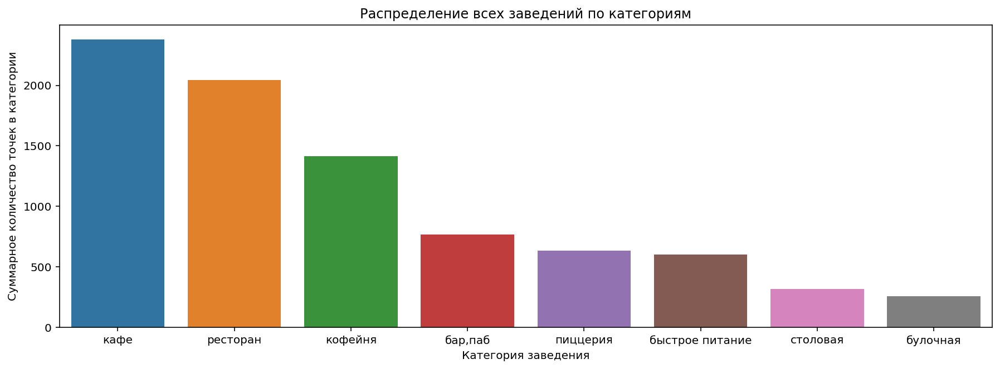

In [20]:
# построим график распределения заведений по категориям методом барплот
msc_pl_tipe = msc_pl.pivot_table(
    index='category', values='lat',  aggfunc='count').sort_values(by='lat', ascending=False)

plt.figure(figsize=(15,5))
sns.barplot(x=msc_pl_tipe.index,y=msc_pl_tipe['lat'])
plt.title("Распределение всех заведений по категориям")
plt.xlabel("Категория заведения")
plt.ylabel("Суммарное количество точек в категории")
plt.show()

**Вывод.** На графике видно, что лидируют такие типы заведений общественного питания, как кафе, рестораны и кофейни, пиццерии только на пятом месте. 
- Больше всего в предстарленных данных заведений с типом "кафе" (2378 единиц). Попробуем разобраться, чем "кафе" отличается от "кофейни". Кофейня - это явно новый тренд. В данных заведениях определяющим стоимостную категорию заведения будет именно кружка кофе. Но проверим данное предположение на реальных данных.
- Ресторанов в Москве 2043.
- Значительно меньше в Москве пабов(баров) - всего 765.
- Примерно одинаковое количество предприятий быстрого питания и пиццерий (603 и 633). По типу основного меню они очень близки. Различия - в основном подаваемом блюде - горячий бутерброд или пицца.
- Меньше всего столовых (315) и булочных (256).
Но по колличественным данным рано делать какие-либо выводы, он будут однобокими. Продолжим изучение данных.

### Распределение посадочных мест.

Исследуем размеры заведений, опираясь на количество посадочных мест.

Проиллюстрируем выводы графиками.

In [21]:
# посчитаем перцентели по количеству посадочных мест
round(msc_pl.groupby('seats')[['category']].count().describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.99]))

,category
count,229.0
mean,21.0
std,38.0
min,1.0
5%,1.0
25%,2.0
50%,6.0
75%,22.0
95%,114.0
99%,173.0


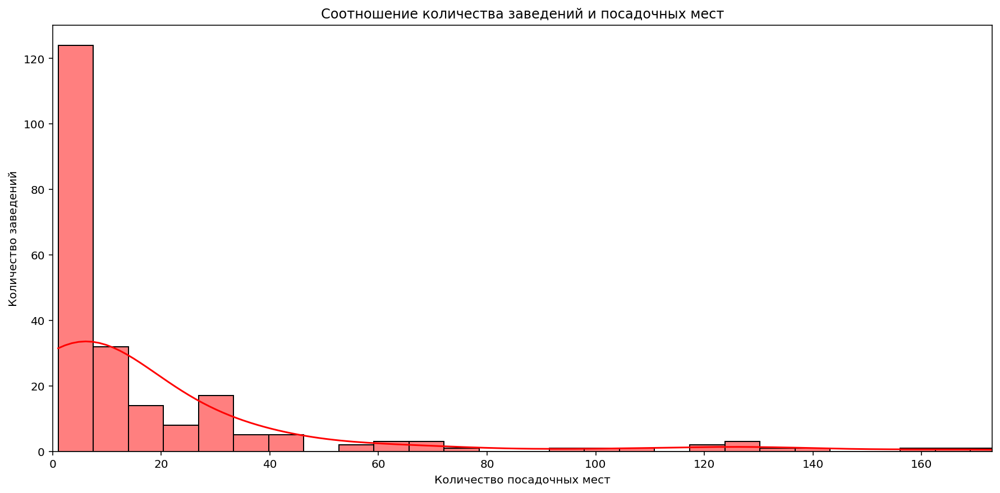

In [22]:
# проиллюстрируем данные графиком
plt.figure(figsize=(15, 7))
sns.histplot(data=msc_pl.groupby('seats')[['category']].count(), x='category', color = "red", kde=True)
plt.title('Соотношение количества заведений и посадочных мест')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Количество заведений')
plt.xlim(0,173)
plt.show()

**Вывод:** основная масса заведений предлагает до 50 посадочных мест, при этом заведений, в которых готовы принть до 22 гостей одновременно - абсолютное большинство (75%). Заведений, предлагающих от 50 до 80, а также от 110 до 150 посадочных мест немного больше, чем заведений,где посадочных мест от 90 до 110 и от 150 до 173. В общей сумме таких заведений менее 20%.

Посмотрим,существенна ли разница между типами заведений по количеству посадочных мест.

Признаем "выбросами" заведения с количеством мест более 173 и посмотрим на соотношение посадочных мест по типам заведений города.

In [23]:
# подсчитаем среднее количество посадочных мест  по категориям заведений
sorted_index= msc_pl.query('seats < 173').groupby('category')['seats'].mean().sort_values(ascending=False).reset_index().round()
sorted_index

,category,seats
0,ресторан,74.0
1,"бар,паб",71.0
2,столовая,68.0
3,кофейня,65.0
4,кафе,60.0
5,быстрое питание,59.0
6,пиццерия,57.0
7,булочная,55.0


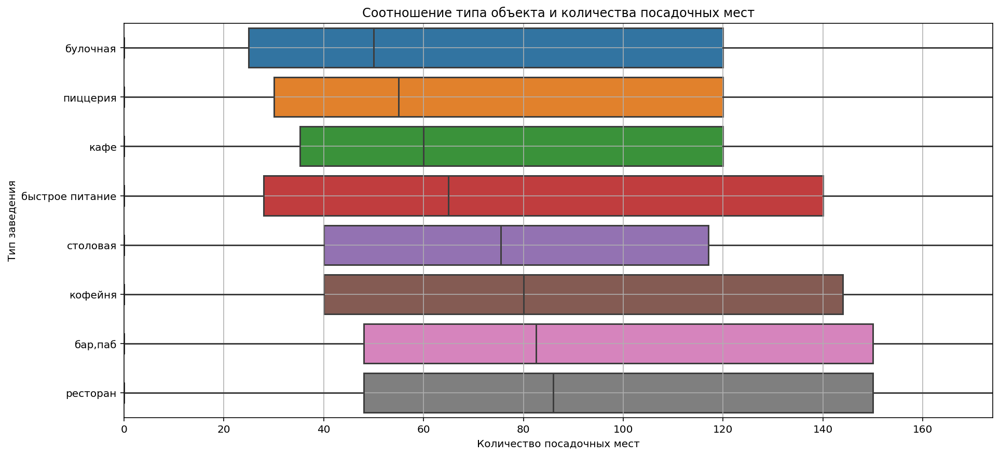

In [24]:
plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='category', data=msc_pl,\
            order=["булочная", "пиццерия", "кафе", "быстрое питание", "столовая", "кофейня", "бар,паб", "ресторан"]) 
plt.xlabel('Количество посадочных мест')
plt.ylabel('Тип заведения')
plt.xlim(0, 174)
plt.grid()
plt.title('Соотношение типа объекта и количества посадочных мест')
plt.show()

**Вывод.** Типы заведений не очень сильно различаются по количеству посадочных мест. 
- Меньше всего посадочных мест в кафе, пиццериях, булочных и, как ни странно, в быстром питании.
- Больше всего посадочных мест в ресторанах и барах-пабах.
- По количеству посадочных мест к ним стремятся  кофейни. Столовые по количеству посадочных мест занимают срединное положение.

### Распределение заведений на сетевые и не сетевые. Определение ТОП-15 сетей в Москве.

In [25]:
#определим количество несетевых и сетевых заведений
ch_gr = msc_pl.groupby('chain')['name'].count().sort_values(ascending=False).reset_index()
ch_gr

,chain,name
0,0,5201
1,1,3205


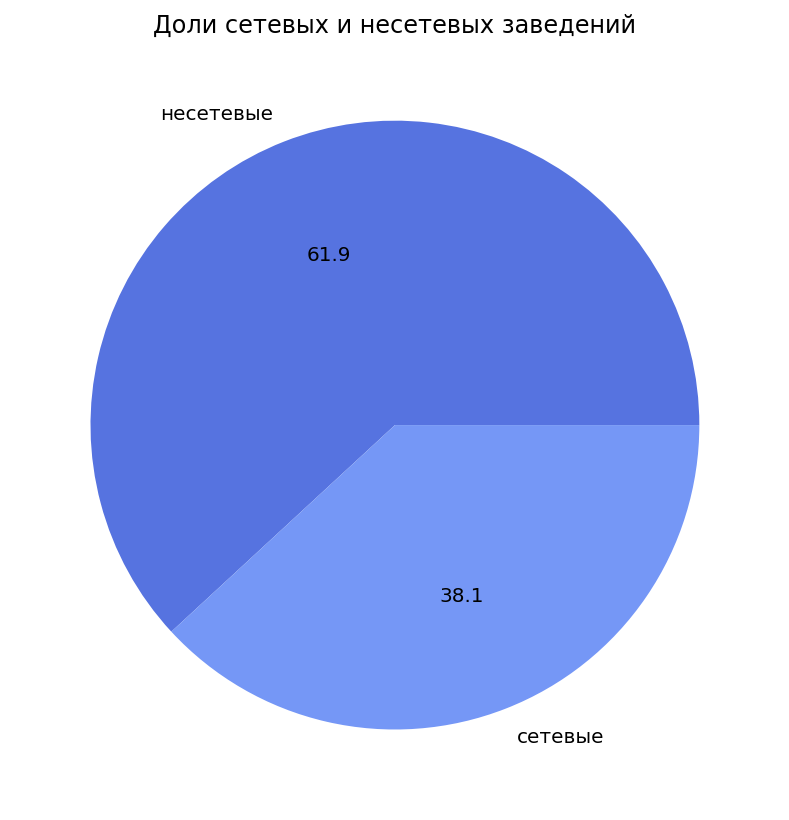

In [26]:
colors = sns.color_palette('coolwarm', 10)
# визуализируем доли несетевых и сетевых заведений
plt.figure(figsize = (7, 7))
plt.pie(ch_gr.name, labels=['несетевые','сетевые'], autopct='%1.1f', colors=colors)
plt.title('Доли сетевых и несетевых заведений')
plt.show()

In [27]:
# создадим датафрейм с отсортированными сетевыми заведениями
ch_qu = msc_pl.query('chain == 1')
#ch_qu.info()
temp = ch_qu.groupby('name')['lat'].count().reset_index()
temp['lat'].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.99])

count    747.000000
mean       4.290495
std        8.530969
min        1.000000
5%         1.000000
25%        2.000000
50%        2.000000
75%        3.000000
95%       13.700000
99%       43.080000
max      120.000000
Name: lat, dtype: float64

In [28]:
# посчитаем круглосуточные заведения: всего и среди сетевых
print(msc_pl.groupby('is_24_7')['lat'].count().reset_index())
print(f' Доля круглосуточных среди всех заведений', round(1266/8406*100,2), '%')
print(ch_qu.groupby('is_24_7')['lat'].count().reset_index())
print(f' Доля круглосуточных среди сетевых заведений', round(429/3205*100,2), '%')

   is_24_7   lat
0        0  7140
1        1  1266
 Доля круглосуточных среди всех заведений 15.06 %
   is_24_7   lat
0        0  2776
1        1   429
 Доля круглосуточных среди сетевых заведений 13.39 %


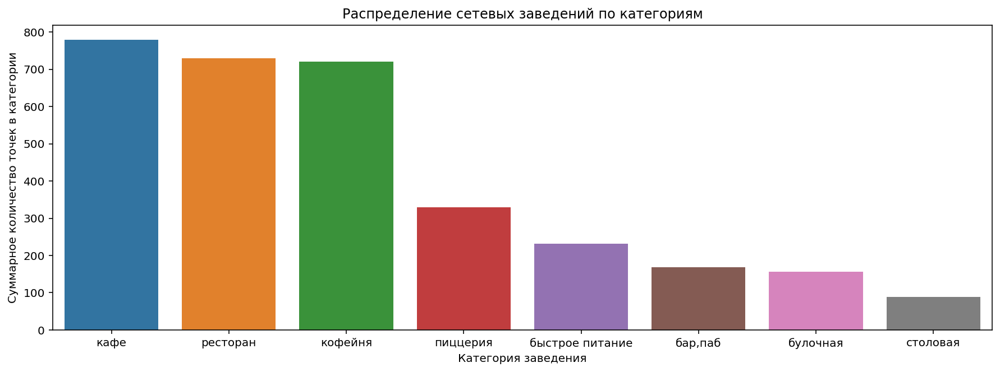

In [29]:
# построим график распределения сетевых заведений по категориям методом барплот
ch_qu_tipe = ch_qu .pivot_table(
    index='category', values='lat',  aggfunc='count').sort_values(by='lat', ascending=False)

plt.figure(figsize=(15,5))
sns.barplot(x=ch_qu_tipe.index,y=ch_qu_tipe['lat'])
plt.title("Распределение сетевых заведений по категориям")
plt.xlabel("Категория заведения")
plt.ylabel("Суммарное количество точек в категории")
plt.show()

In [30]:
# Подготовим данные для отражения соотношения сетевых и не сетевых заведений.
ch_tipe = msc_pl.pivot_table(
    index='category', values='lat', columns = 'chain', aggfunc='count').reset_index()
ch_tipe['all'] = ch_tipe[0] + ch_tipe[1]
ch_tipe['perc'] = (ch_tipe[1] / ch_tipe['all']*100).round()
ch_tipe = ch_tipe.sort_values(by='all', ascending=False)
ch_tipe

chain,category,0,1,all,perc
3,кафе,1599,779,2378,33.0
6,ресторан,1313,730,2043,36.0
4,кофейня,693,720,1413,51.0
0,"бар,паб",596,169,765,22.0
5,пиццерия,303,330,633,52.0
2,быстрое питание,371,232,603,38.0
7,столовая,227,88,315,28.0
1,булочная,99,157,256,61.0


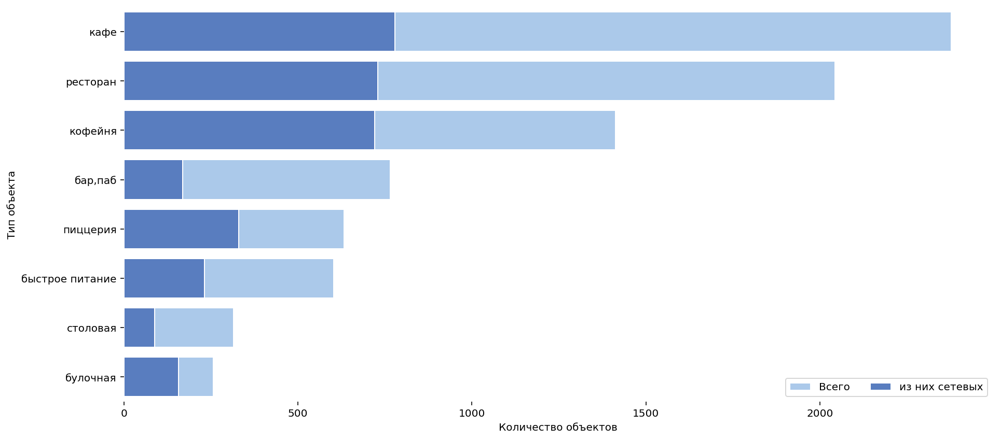

In [31]:
# отобразим общее соотношение сетевых и несетевых заведений по категориям
f, ax = plt.subplots(figsize = (15,7))
sns.set_color_codes('pastel')
sns.barplot(x = 'all', y = 'category', data = ch_tipe,
            label = 'Всего', color = 'b', edgecolor = 'w')
sns.set_color_codes('muted')
sns.barplot(x = 1, y = 'category', data = ch_tipe,
            label = 'из них сетевых', color = 'b', edgecolor = 'w')
ax.legend(ncol = 2, loc = 'lower right')
ax.set(ylabel="Тип объекта", xlabel="Количество объектов")
sns.despine(left = True, bottom = True)
plt.show()

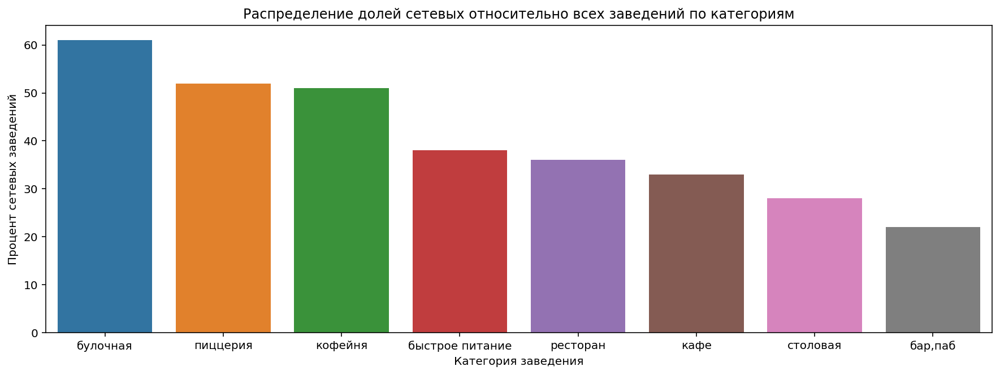

In [32]:
# построим график распределения долей сетевых заведений по категориям методом барплот
ch_tipe1 = ch_tipe.pivot_table(
    index='category', values='perc').sort_values(by='perc', ascending=False)

plt.figure(figsize=(15,5))
sns.barplot(x=ch_tipe1.index,y=ch_tipe1['perc'])
plt.title("Распределение долей сетевых относительно всех заведений по категориям")
plt.xlabel("Категория заведения")
plt.ylabel("Процент сетевых заведений")
plt.show()

**Вывод.** 38,1% заведений являются сетевыми (3205 единиц). До четверти сетевых заведения состоят всего из 1 торговой точки (возможно, заведения той же сети есть в других городах). Среднее количество точек в сети -4, максимальное - 120. При этом всего 1% сетевых заведений имеет более 42 точек в Москве.

Судя по графику распределения сетевых заведений по категориям - лидируют кафе, рестораны и кофейни. При этом если рассматривать долю сетевых заведений среди общего количества - в лидерах будут булочные (61%), пиццерии (52%) и кофейни. В быстром питании сетевых заведений всего 38%. Тренды меняются, и,видимо, Макдональд'C - больше не ресторан.

При сравнении доли круглосуточных заведений среди всех и среди сетевых, можно сказать что она меньше почти на 2 процента (15,06% и 13,39% соответственно.

**Определим самые большие сети.**

In [33]:
#Сгруппируем данные по названиям заведений и найдём ТОП-15 популярных сетей в Москве. 
temp_top = msc_pl[['name','category','chain']]
temp_top = temp_top[temp_top['chain'] == 1]
temp_top1 = temp_top.groupby(['name','category']).count()
temp_top1 = temp_top1.sort_values(by='chain', ascending=False).head(15).reset_index()
temp_top1

,name,category,chain
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


In [34]:
# сгруппируем данные
pie_temp = temp_top1[['category','chain']]
pie_temp = pie_temp.groupby(['category']).sum('chain').reset_index()
pie_temp

,category,chain
0,булочная,25
1,кафе,89
2,кофейня,350
3,пиццерия,150
4,ресторан,154


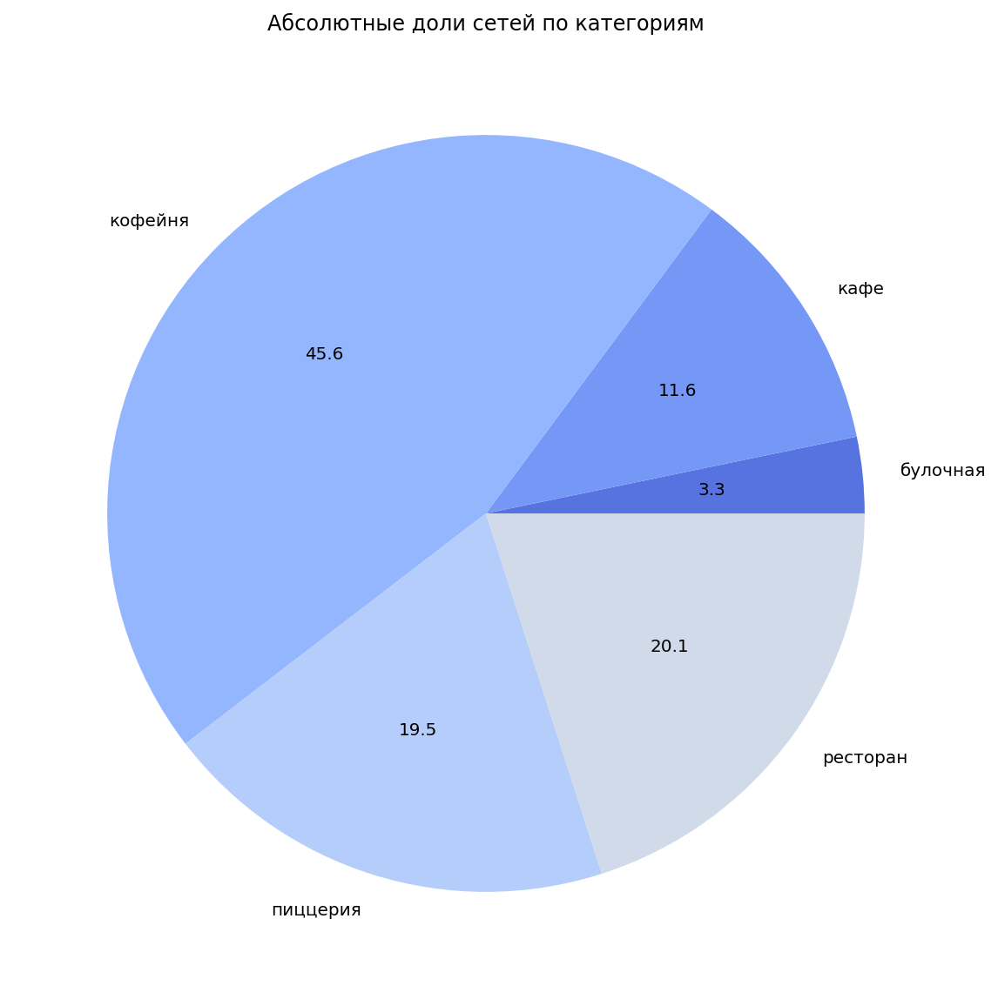

In [35]:
# построим визуализацию методом pie
plt.figure(figsize = (10, 10))
plt.pie(pie_temp.chain, labels=pie_temp.category, autopct='%1.1f', colors=colors)
plt.title('Абсолютные доли сетей по категориям')
plt.show()

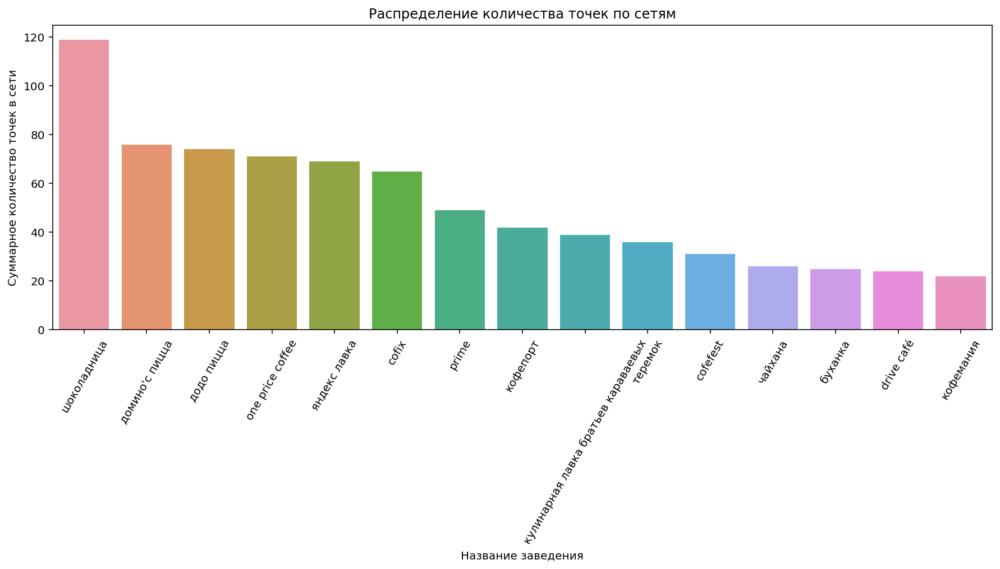

In [36]:
# визуализируем по количеству точек все ТОП-15 сетевых заведений
plt.figure(figsize=(15,5))
sns.barplot(x=temp_top1.name,y=temp_top1['chain'])
plt.title("Распределение количества точек по сетям")
plt.xlabel("Название заведения")
plt.ylabel("Суммарное количество точек в сети")
plt.xticks(rotation = 60)
plt.show()

**Вывод.** Почти половина самых популярных (сетевых с самым большим количеством точек) заведений в регионе (45,6%) по типу заведения являются кофейнями. Кафе (11,6%) и булочные (3,3%) по типу предлагаемого меню близки к кофейням, хотя их ассортимент более разнообразен (не только сладости и десерты).

Довольно популярны рестораны (20,1%) и пиццерии (19,5%). Самые крупные сетевые рестораны Яндекс Лавка, Prime и Теремок. Самые крупные пиццерии Домино'с Пицца и Додо Пицца.

Таким образом,среди самых популярных сетей 3 ресторана, 2 пиццерии, 3 кафе, 1 булочная - всё остальное - кофейни. Самая крупная сеть кофеен - Шоколадница. При этом география этой сети тоже весьма обширная: у нас в Краснодаре тоже есть заведения этой сети.

Заведения быстрого питания, столовые и бары,пабы отсутствуют среди самых популярных сетей.

### Распределение категорий заведений по округам.

Отобразим общее количество заведений и количество заведений каждой категории по районам города.

In [37]:
# Подготовим данные по общему количеству заведений по округам.
dist = msc_pl.groupby(['district']).count().reset_index()
dist = dist[['district','chain']]
dist

,district,chain
0,Восточный административный округ,798
1,Западный административный округ,851
2,Северный административный округ,900
3,Северо-Восточный административный округ,891
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


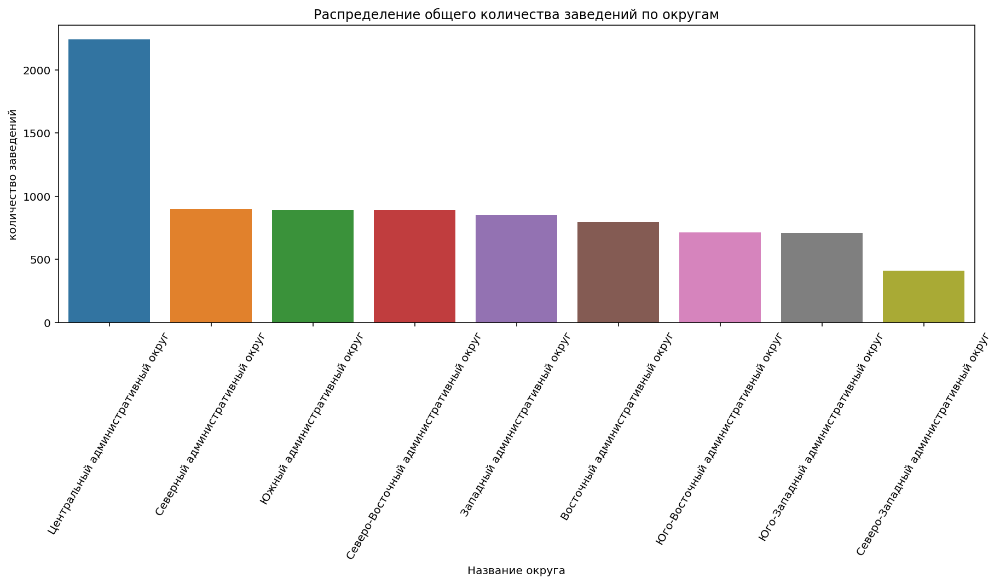

In [38]:
# построим график распределения общего количества заведений по округам
dist1 = dist.pivot_table(
    index='district', values='chain').sort_values(by='chain', ascending=False)

plt.figure(figsize=(15,5))
sns.barplot(x=dist1.index,y=dist1['chain'])
plt.title("Распределение общего количества заведений по округам")
plt.xlabel("Название округа")
plt.ylabel("количество заведений")
plt.xticks(rotation = 60)
plt.show()

In [39]:
# Детализируем данные, добавим распределение по категориям
dist2 = msc_pl.groupby(['district','category']).count().sort_values(by='chain', ascending=False).reset_index()
dist2 = dist2[['district','category','chain']]
dist3 = msc_pl.groupby(['district']).sum().sort_values(by=['chain'], ascending=False)
dist3

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7
district,,,,,,,,
Центральный административный округ,125002.512373,84340.559248,9814.4,1262521.0,31243.0,875,143765.0,162
Западный административный округ,47414.806680,31894.982753,3558.5,322287.0,9482.0,376,74237.0,138
Северный административный округ,50244.449819,33773.997474,3815.8,298803.0,12712.0,347,62415.0,125
Северо-Восточный административный округ,49758.597264,33522.588194,3696.1,215700.0,9920.0,334,49900.0,136
Южный административный округ,49643.753124,33585.889104,3732.5,262001.0,7260.0,312,62323.0,140
Юго-Западный административный округ,39463.239103,26617.354123,2958.6,186252.0,6422.0,302,38208.0,132
Восточный административный округ,44514.733895,30131.758912,3331.0,213363.0,7309.0,283,34784.0,172
Юго-Восточный административный округ,39765.585196,26953.408427,2928.2,126895.0,5277.0,220,28732.0,178
Северо-Западный административный округ,22827.735339,15317.104007,1721.4,129089.0,3851.0,156,25518.0,83


In [40]:
# отобразим категории заведений по округам на одном графике
fig = px.bar(dist2, x='district', y='chain', color='category',\
             category_orders={"district": ["Центральный административный округ", "Северный административный округ", "Южный административный округ",\
                                          "Северо-Восточный административный округ", "Западный административный округ", "Восточный административный округ",\
                                          "Юго-Восточный административный округ", "Юго-Западный административный округ", "Северо-Западный административный округ"]})
fig.show()

**Вывод.** Распределение заведений по типам по округам примерно одинаковое. Количество пиццерий, быстрого питания, столовых и булочных настолько незначительное, что есть соблазн определить их все в категорию "прочие". Количесатво баров, пабов значительно только в Центральном административном округе. Этот округ резко выделяется среди прочих административных округов, он - самый густонаселённый, при этом здесь 4 позиции категорий заведений по количеству представлены значительно. В остальных административных округах таких позиций 3. Выделяется также Северо-Западный административный округ с самым маленьким количеством заведений. Стоит обратить внимание на количество кофеен. В значениях на графике по этой позиции самый большой разнобой по районам города, но везде они стабильно занимают третью позицию.

### Визуализация распределения средних рейтингов заведений и средних чеков заведений.


Визуализируем распределение средних рейтингов по категориям заведений.

In [41]:
# импортируем необходимые библиотеки
import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium import Marker
import folium
from folium.plugins import MarkerCluster

In [42]:
# подготовим данные
avg_mean = msc_pl.groupby('district')['rating'].mean().sort_values(ascending=False)
avg_mean

district
Центральный административный округ         4.377520
Северный административный округ            4.239778
Северо-Западный административный округ     4.208802
Южный административный округ               4.184417
Западный административный округ            4.181551
Восточный административный округ           4.174185
Юго-Западный административный округ        4.172920
Северо-Восточный административный округ    4.148260
Юго-Восточный административный округ       4.101120
Name: rating, dtype: float64

In [43]:
# построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_mean,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
#m  # раскомментировать эту строку

**Вывод.** Максимально высокий средний рейтинг заведений в Центральном административном округе (4,33 - 4,38), а самый низкий (4,10)- в Юго-Восточном административном округе. На севере столицы (Северный административный округ) средний рейтинг заведений 4,24 - 4.29; в Северо-Западном административном округе - 4,19 - 4,24. В остальных округах столицы средний рейтинг заведений одинаковый - 4,15 - 4,19. 

Усреднённые рейтинги в разных типах общепита различаются мало.

**Исследуем медианный средний чек заведений по районам.**

In [44]:
# подготовим данные
avg_median = msc_pl.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False)
avg_median

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

In [78]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
#m  # раскомментировать эту строку

**Вывод.** Средний чек в Западном и Центральном округах достигает 1000 рублей. По мереудалённости от центра в сторону северо-запада он снижается до 700-650 рублей, а при удалении от центра в южную и восточную стороны - до 600 - 450 рублей. При удалении от центра города цены снижаются существенно.

### Определение ТОП-15 улиц по количеству заведений.

Найдём ТОП-15 улиц по количеству заведений.

In [46]:
# нанесём маркеры всех заведений общепита Москвы на карту города
#moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
#m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=16)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
msc_pl.apply(create_clusters, axis=1)

# выводим карту
m


In [47]:
#определим 15 улиц, где больше всего заведений
street_top = msc_pl[['name','district','street']]
street_top1 = street_top.groupby(['street','district']).count()
street_top1 = street_top1.sort_values(by='name', ascending=False).head(16).reset_index()
street_top1

,street,district,name
0,проспект мира,Северо-Восточный административный округ,132
1,профсоюзная улица,Юго-Западный административный округ,122
2,проспект вернадского,Западный административный округ,95
3,ленинградский проспект,Северный административный округ,95
4,каширское шоссе,Южный административный округ,77
5,варшавское шоссе,Южный административный округ,76
6,ленинградское шоссе,Северный административный округ,70
7,ленинский проспект,Юго-Западный административный округ,66
8,дмитровское шоссе,Северный административный округ,65
9,люблинская улица,Юго-Восточный административный округ,60


In [80]:
# отобразим на графике количество заведений на топ-15 улицах столицы
fig = px.bar(street_top1, x='street', y='name', color='district')
fig.show()

In [49]:
# посчитаем круглосуточные заведения на самых популярных улицах города
ch_qu.groupby('is_24_7')['lat'].count().reset_index()
print(f' Доля круглосуточных среди заведений ТОП-15 улиц', round(429/3205*100,2), '%')

 Доля круглосуточных среди заведений ТОП-15 улиц 13.39 %


In [50]:
# отсортируем данные по ТОП-15 улицам города 
street_top2 = msc_pl.query('street in @street_top1.street')
#street_top2

# отобразим маркеры заведений по округам на карте города
# применяем функцию для создания маркера к ТОП-15 улицам столицы
#street_top2.apply(create_marker, axis=1)
    
    
# выводим карту
#m

In [51]:
# посмотрим, какого размера заведения на самых популярных улицах Москвы
street_top2['seats'].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.99])

count     795.000000
mean      163.355975
std       200.790705
min         0.000000
5%         18.000000
25%        50.000000
50%        98.000000
75%       190.000000
95%       625.000000
99%      1288.000000
max      1288.000000
Name: seats, dtype: float64

In [52]:
# посчитаем медианное количество посадочных мест по заведениям на самых популярных улицах 
street_top2.groupby('street')['seats'].median().sort_values(ascending=False)

street
проспект мира             200.0
пятницкая улица           150.0
алтуфьевское шоссе        120.0
дмитровское шоссе         120.0
каширское шоссе           110.0
проспект вернадского      100.0
варшавское шоссе           98.0
ленинградский проспект     98.0
ленинградское шоссе        96.0
ленинский проспект         96.0
кутузовский проспект       92.0
профсоюзная улица          86.0
улица миклухо-маклая       65.0
люблинская улица           58.0
измайловское шоссе         55.0
Name: seats, dtype: float64

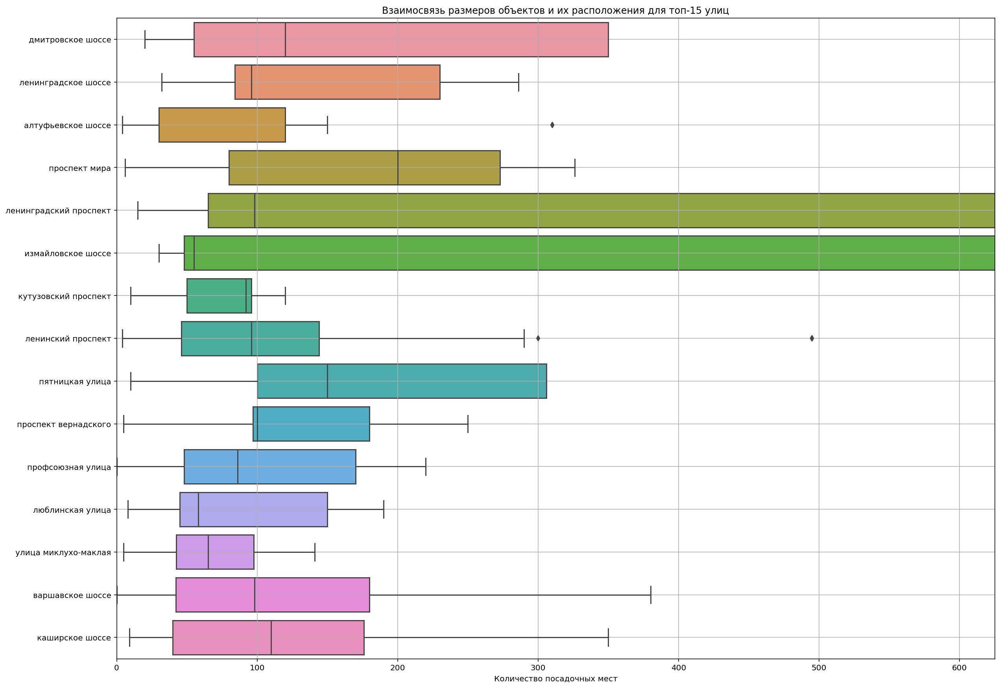

In [53]:
#проиллюстрируем выводы графиком
plt.figure(figsize=(20, 15))
sns.boxplot(x='seats', y='street', data=street_top2) 
plt.xlabel('Количество посадочных мест')
plt.ylabel('')
plt.xlim(0, 625)
plt.grid()
plt.title('Взаимосвязь размеров объектов и их расположения для топ-15 улиц')
plt.show()

In [54]:
# подготовим данные лоя визуализации соотношения категорий заведений на самых популярных улицах города
street_top_ct = street_top2.groupby(['street','category']).count().sort_values(by='name', ascending=False).reset_index()
street_top_ct = street_top_ct[['street','category','name']]
street_top_ct.head()

,street,category,name
0,проспект мира,кафе,53
1,проспект мира,ресторан,45
2,проспект мира,кофейня,36
3,профсоюзная улица,кафе,35
4,ленинский проспект,ресторан,33


In [55]:
# отобразим на графике категории заведений на топ-15 улицах столицы
fig = px.bar(street_top_ct, x='street', y='name', color='category', category_orders={"street": ["проспект мира", "профсоюзная улица", "проспект вернадского",\
                                          "ленинский проспект", "ленинградский проспект", "дмитровское шоссе",\
                                          "каширское шоссе", "варшавское шоссе", "ленинградское шоссе",\
                                          "люблинская улица", "кутузовский проспект", "улица миклухо-маклая",\
                                          "пятницкая улица", "алтуфьевское шоссе", "измайловское шоссе"]})
fig.show()


In [57]:
# подготовим данные лоя визуализации соотношения категорий заведений на самых популярных улицах города
street_top2 = msc_pl.groupby(['street','category']).count().sort_values(by='chain', ascending=False).reset_index()
street_top2 = street_top2[['street','category','chain']]
street_top2 = msc_pl.groupby(['street']).sum().sort_values(by=['chain'], ascending=False)
street_top2.head(15)

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7
street,,,,,,,,
проспект мира,10270.352185,6925.505825,758.2,60266.0,1691.0,70,15926.0,12
проспект вернадского,6012.367801,4049.440312,455.7,44921.0,755.0,58,21019.0,13
профсоюзная улица,6789.724556,4579.647772,511.3,32198.0,971.0,55,9791.0,20
каширское шоссе,4284.529404,2900.688292,319.0,55592.0,654.0,44,7685.0,12
дмитровское шоссе,4917.047965,3304.430514,365.5,41970.0,972.0,40,9669.0,10
ленинский проспект,5958.032294,4016.569409,450.7,39790.0,2019.0,38,10800.0,15
ленинградский проспект,5300.727315,3566.039190,408.0,53815.0,2063.0,37,19067.0,10
ленинградское шоссе,3908.328329,2624.092425,291.9,38247.0,390.0,31,5005.0,8
мкад,3619.584546,2449.977290,267.9,4855.0,0.0,29,0.0,28


### Вывод.
При определении ТОП-15 улиц по количеству заведений общепита мы вывели 16 позиций, поскольку Проспект Мира проходит через 2 административных округа: Северо-Восточный и Центральный. 

- Детально рассмотреть  местополохение всех заведений Москвы и заведений на ТОП-15 улицах Москвы можно, запустив карту с маркерами заведений (раскомментировать код).
- Доля круглосуточных заведений среди заведений на ТОП-15 улицах -13,39%.
- На ТОП-15 улмицах столицы находятся довольно крупные заведения: медианное количество посадочных мест - 200 на проспекте Мира, 150 - на Пятницкой улице.Самое маленькое количество посадочных мест - 55 - на Измайловском шоссе.
- График количества заведений на ТОП-15 улиц по категориям показывает явное преимущество по трём типам заведений (как и в целом по городу). Пиццерии на этих улицах более многочисленны, категории булочная, быстрое питание и столовая так же малочисленны, как и в целом по городу. Для категорий бар,паб и кофейня - все очень неоднозначно: на проспекте Мира, Ленинском и Лениградском проспектах их значительно больше, чем в целом по городу.

### Определение улиц с единственным заведением.
Исследуем улицы, на которых находится только один объект общепита.

In [60]:
street_1 = msc_pl.groupby('street')['name'].count().sort_values(ascending=True).reset_index().query('name == 1')
street_1 = msc_pl.query('street in @street_1.street')
street_1.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,0
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,0
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,0
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,0
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,0


In [61]:
# сгруппируем улицы по округам
district_1 = street_1.groupby('district')['street'].count().sort_values(ascending=False)
print(district_1.sum())
district_1

457


district
Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: street, dtype: int64

In [62]:
# отображаем эти единичные заведения на карте
# применяем функцию для создания маркера к ТОП-15 улицам столицы
#street_1.apply(create_marker, axis=1)
    
    
# выводим карту
#m

In [63]:
# посмотрим, какого размера заведения на улицах Москвы, где только 1 заведение
street_1['seats'].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.99])

count    156.000000
mean      59.115385
std       48.274880
min        0.000000
5%         5.750000
25%       30.000000
50%       45.000000
75%       80.000000
95%      158.250000
99%      229.000000
max      240.000000
Name: seats, dtype: float64

In [64]:
# сгруппируем единственные на улице заведения по категориям 
category_1 = street_1.groupby('category')['street'].count().sort_values(ascending=False)
print(category_1)
print()
is_= street_1.groupby('is_24_7')['street'].count().sort_values(ascending=False)
print(is_)
print()
print(f' Доля круглосуточных среди единственных на улице заведений', round(58/458*100,2), '%')

category
кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

is_24_7
0    399
1     58
Name: street, dtype: int64

 Доля круглосуточных среди единственных на улице заведений 12.66 %


**Вывод:** Всего улиц с единственным заведением в столице - 458. Больше всего таких улиц в Центральном административном округе (145), меньше всего - в Юго-Западном административном округе (18).

Детально рассмотреть расположение этих улиц и заведений на них можно на карте с маркерами (раскомментировать код).

Средние размеры этих заведений - 60 посадочных мест, не имеют посадочныхмест до 5% заведений.

Среди категорий заведений преобладают кафе, рестиораны и кофейни. Меньше всего пиццерий и булочных.

Доля круглосуточных заведений 12,66%.

### Общие выводы по разделу.

- При анализе распределения заведений по типам мы установили, что лидируют такие типы заведений общественного питания, как кафе, рестораны и кофейни, пиццерии только на пятом месте. Меньше всего столовых и булочных.

- Основная масса заведений предлагает до 50 посадочных мест, при этом заведений, в которых готовы принть до 22 гостей одновременно - абсолютное большинство (75%).
- Типы заведений не очень сильно различаются по количеству посадочных мест. Меньше всего посадочных мест в кафе, пиццериях, булочных и, как ни странно, в быстром питании. Больше всего посадочных мест в ресторанах и барах-пабах.По количеству посадочных мест к ним стремятся  кофейни. Столовые по количеству посадочных мест занимают срединное положение.

- 38,1% заведений являются сетевыми (3205 единиц). До четверти сетевых заведения состоят всего из 1 торговой точки (возможно, заведения той же сети есть в других городах). Среднее количество точек в сети -4, максимальное - 120. При этом всего 1% сетевых заведений имеет более 42 точек в Москве.

- Доля круглосуточных заведений среди всех и среди сетевых различается почти на 2 процента (15,06% и 13,39% соответственно.)Такая же доля круглосуточных заведений (13,39%) на ТОП-15 улицах Москвы Доля круглосуточных заведений среди единственных на улице - 12,66%.

- Почти половина самых популярных (сетевых с самым большим количеством точек) заведений в регионе (45,6%) по типу заведения являются кофейнями. Самая крупная сеть кофеен - Шоколадница. При этом география этой сети тоже весьма обширная: у нас в Краснодаре тоже есть заведения этой сети. Довольно популярны рестораны (20,1%) и пиццерии (19,5%). Самые крупные сетевые рестораны Яндекс Лавка, Prime и Теремок. Самые крупные пиццерии Домино'с Пицца и Додо Пицца. Сетевые пиццерии тоже имеют общирную географию.
- Заведения быстрого питания, столовые и бары,пабы отсутствуют среди самых популярных сетей.

- Распределение заведений по типам по округам примерно одинаковое. Количество пиццерий, быстрого питания, столовых и булочных настолько незначительное, что есть соблазн определить их все в категорию "прочие". Количесатво баров, пабов значительно только в Центральном административном округе. Этот округ резко выделяется среди прочих административных округов, он - самый густонаселённый, при этом здесь 4 позиции категорий заведений по количеству представлены значительно. В остальных административных округах таких позиций 3. Выделяется также Северо-Западный административный округ с самым маленьким количеством заведений. Стоит обратить внимание на количество кофеен. В значениях на графике по этой позиции самый большой разнобой по районам города, но везде они стабильно занимают третью позицию.

- Максимально высокий средний рейтинг заведений в Центральном административном округе (4,33 - 4,38), а самый низкий (4,10)- в Юго-Восточном административном округе. На севере столицы (Северный административный округ) средний рейтинг заведений 4,24 - 4.29; в Северо-Западном административном округе - 4,19 - 4,24. В остальных округах столицы средний рейтинг заведений одинаковый - 4,15 - 4,19.
- Усреднённые рейтинги в разных типах общепита различаются мало.

- Средний чек в Западном и Центральном округах достигает 1000 рублей. По мереудалённости от центра в сторону северо-запада он снижается до 700-650 рублей, а при удалении от центра в южную и восточную стороны - до 600 - 450 рублей. При удалении от центра города цены снижаются существенно.

- На ТОП-15 улмицах столицы находятся довольно крупные заведения: медианное количество посадочных мест - 200 на проспекте Мира, 150 - на Пятницкой улице.Самое маленькое количество посадочных мест - 55 - на Измайловском шоссе.
- График количества заведений на ТОП-15 улиц по категориям показывает явное преимущество по трём типам заведений (как и в целом по городу). Пиццерии на этих улицах более многочисленны, категории булочная, быстрое питание и столовая так же малочисленны, как и в целом по городу. Для категорий бар,паб и кофейня - все очень неоднозначно: на проспекте Мира, Ленинском и Лениградском проспектах их значительно больше, чем в целом по городу.

- Средние размеры единственных на улице заведений - 60 посадочных мест, не имеют посадочныхмест до 5% заведений. Среди категорий заведений преобладают кафе, рестиораны и кофейни. Меньше всего пиццерий и булочных.

## Часть 3. Детализация исследования под конкретную задачу - открытие кофейни.

Детализируем исследование: открытие кофейни. Определим:
- Количество кофеен в данных;
- Режим работы кофеен;
- Распределение их по районам;
- Рейтинг и стоимость чашки кавучино.

Сднлпем общие выводы.

In [65]:
msc_pl.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,0
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,0
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,0


### Количество кофеен в данных.

In [66]:
# создадим датафрейм с отсортированными кофейнями
coffee_house = msc_pl.query('category == "кофейня"')
coffee_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24_7            1413 non-null   int64  
dtypes: float64(6), int64(2),

### Распределение кофеен по округам.

In [67]:
# сгруппируем кофейни по округам
distr_с = coffee_house.groupby('district')['category'].count().sort_values(ascending=False)
display(distr_с.sum())
distr_с

1413

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: category, dtype: int64

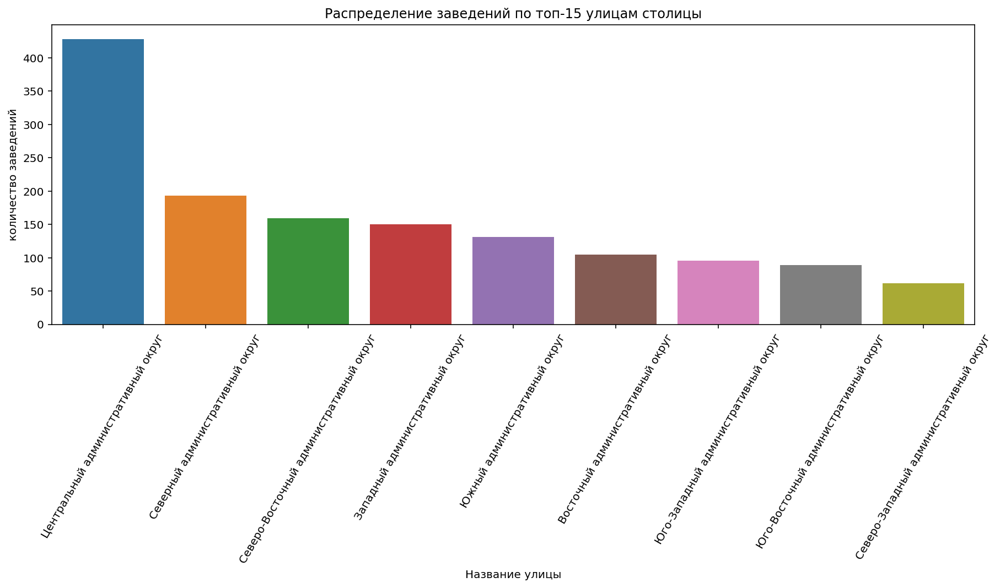

In [68]:
# построим график распределения кофеен по округам
coffee_house0 = coffee_house.pivot_table(
    index='district', values='chain', aggfunc={"chain": len}).sort_values(by='chain',ascending=False)


plt.figure(figsize=(15,5))
sns.barplot(x=coffee_house0.index,y=coffee_house0['chain'])
plt.title("Распределение заведений по топ-15 улицам столицы")
plt.xlabel("Название улицы")
plt.ylabel("количество заведений")
plt.xticks(rotation = 60)
plt.show()

### Режим работы кофеен.

In [69]:
# определим количество и долю круглосуточных кофеен всего по городу
is_1= coffee_house.groupby('is_24_7')['street'].count().sort_values(ascending=False)
print(is_1)
print()
print(f' Доля круглосуточных среди кофеен', round(74/1413*100,2), '%')

is_24_7
0    1339
1      74
Name: street, dtype: int64

 Доля круглосуточных среди кофеен 5.24 %


### Рейтинг кофеен и стоимость чашки капуччино.

In [70]:
# подготовим данные
c_hr = round(coffee_house.groupby('district')['rating'].mean().sort_values(ascending=False),2)
c_hr

district
Центральный административный округ         4.34
Северо-Западный административный округ     4.33
Северный административный округ            4.29
Юго-Западный административный округ        4.28
Восточный административный округ           4.28
Южный административный округ               4.23
Юго-Восточный административный округ       4.23
Северо-Восточный административный округ    4.22
Западный административный округ            4.20
Name: rating, dtype: float64

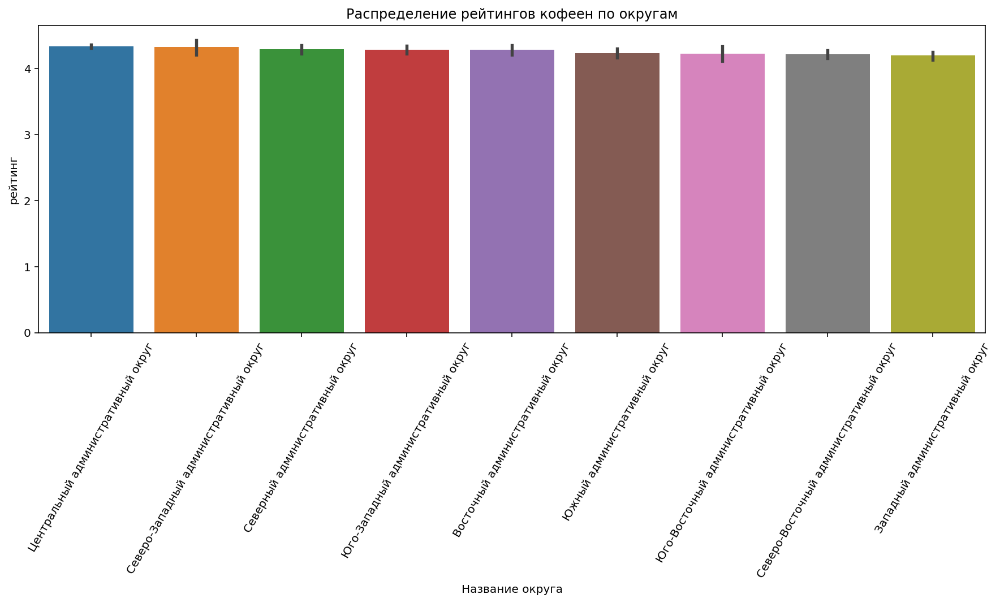

In [71]:
# визуализируем распределение рейтингов кофеен по округам города
coffee_house1 = coffee_house.pivot_table(
    index='district', values='rating', aggfunc='mean').sort_values(by='rating',ascending=False)

plt.figure(figsize=(15,5))
sns.barplot(x=coffee_house.district,y=coffee_house['rating'],\
            order=["Центральный административный округ", "Северо-Западный административный округ", "Северный административный округ",\
                   "Юго-Западный административный округ", "Восточный административный округ", "Южный административный округ",\
                   "Юго-Восточный административный округ","Северо-Восточный административный округ","Западный административный округ"])
plt.title("Распределение рейтингов кофеен по округам")
plt.xlabel("Название округа")
plt.ylabel("рейтинг")
plt.xticks(rotation = 60)
plt.show()

In [72]:
# Посмотрим, какие у кофеен рейтинги в целом по городу 
coffee_house['rating'].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.99])

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
5%          3.700000
25%         4.100000
50%         4.300000
75%         4.400000
95%         4.900000
99%         5.000000
max         5.000000
Name: rating, dtype: float64

Рейтинг кофеен по округам города применрно равный. Разброс значений рейтинга присутсвует, но он небольшой. Заметен он в Северо-Западном и Юго-Восточном округах.

In [73]:
# посмотрим, как распределяется стоимостьчашки капучино по кофейням
coffee_house['middle_coffee_cup'].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.99])

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
5%         60.000000
25%       124.000000
50%       170.000000
75%       225.000000
95%       275.000000
99%       312.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [74]:
# подготовим данные
mcc_mean = coffee_house.groupby('district')['middle_coffee_cup'].mean().sort_values(ascending=False)
mcc_mean

district
Западный административный округ            189.938776
Центральный административный округ         187.518519
Юго-Западный административный округ        184.176471
Восточный административный округ           174.023810
Северный административный округ            165.789474
Северо-Западный административный округ     165.523810
Северо-Восточный административный округ    165.333333
Южный административный округ               158.488372
Юго-Восточный административный округ       151.088235
Name: middle_coffee_cup, dtype: float64

In [81]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=mcc_mean,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки кофе по районам',
).add_to(m)

# выводим карту
#m  # раскомментировать эту строку

**Вывод** Такким образом, самый дорогой кофе у нас на западе, юго-западе и в центре столицы.

In [76]:
# Найдём популярные сети кофеен в Москве. 
temp_ch = coffee_house[['name','category','chain']]
temp_ch = temp_ch[temp_ch['chain'] == 1]
temp_ch1 = temp_ch.groupby(['name','category']).count()
temp_ch1 = temp_ch1.sort_values(by='chain', ascending=False).head(20).reset_index()
temp_ch1

,name,category,chain
0,шоколадница,кофейня,119
1,one price coffee,кофейня,71
2,cofix,кофейня,65
3,кофепорт,кофейня,42
4,cofefest,кофейня,31
5,кофемания,кофейня,22
6,cinnabon,кофейня,20
7,правда кофе,кофейня,13
8,krispy kreme,кофейня,9
9,coffeekaldi's,кофейня,8


In [77]:
#построим график количества точек популярных сетей кофеен
fig = px.bar(temp_ch1, x='chain', y='name', color='category')
fig.show()

### Общие выводы по разделу.

- Всего в данных 1413 кофеен.
- Больше всего кофеен в Центральном административном округе (428),меньше всего - в Северо- Западном (62). Детально рассмотреть расположение кофеен можно на интерактивном графике.
- Доля круглосуточных заведений среди кофеен очень маленькая - 5,24%. 
- Медианный рейтинг кофеен 4,3. По округам рейтинг различается не существенно. "Планка" категории заведений высока.
- Самые популярные сети кофеен в Москве - "Шоколадница", "One Price Coffee", "Cofix".
- При открытии стоит ориентироваться на стоимость чашки капуччинов 175 рублей (среднее значение по кофейням). Самый дорогой кофе на западе, юго-западе и в центре столицы.

## Часть 4. Общие выводы по проекту и презентация для инвесторов.


### Общие выводы.

**Задача:** Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

**Выводы:** Мечта заказчиков осуществима хотя бы по правилу трёх "Н" - Нет Ничего Невозможного.

Опираясь на результаты исследования - считаю,что изобретать что-то принципиально новое будет очень затратно, в том числе, в плане времени. Тем более, что интерес заказчика в определённом направлении выражен конкретно. Инвесторы не одиноки в интересе к сериалу "Друзья" и месту действия - кофейне. Данная идея уже нашла своё воплощение.

**Рекомендация:**
- выкупить у франчайзора небольшой сети кофеен "ФРЕНДС" сеть полностью с правом продажи франшизы 
- или купить франшизу и организовать одну-несколько точек в Москве (возможно, в других городах) уже существующей сетевой тематической кофейни "ФРЕНДС". (На сегодняшний день в сети уже жействуют 3 кофейни в Москве (в Центральном, и Восточном административных округах) и 2 в Санкт-Петербурге. Информация с сайта https://friendsmsk.ru/)

**Вариант рекомендации** Создать свою альтернативную сеть кофеен по мотивам популярного сереала в количестве не менее 3-х точек в Центральном, Западном и Юго-Западном округах.

### Презентация для инвесторов.

[презентация для инвесторов здесь:](https://disk.yandex.ru/i/PwMzJd7WhJZ7xg)